In [2]:
import tensorflow_datasets as tfds
import tensorflow as tf

# Cargar el dataset sin formato supervisado
datos, metadatos = tfds.load('stanford_online_products', as_supervised=False, with_info=True)


In [3]:
#Imprimir los metadatos para revisarlos
metadatos

tfds.core.DatasetInfo(
    name='stanford_online_products',
    full_name='stanford_online_products/1.0.0',
    description="""
    Stanford Online Products Dataset
    """,
    homepage='http://cvgl.stanford.edu/projects/lifted_struct/',
    data_dir='/root/tensorflow_datasets/stanford_online_products/1.0.0',
    file_format=tfrecord,
    download_size=2.87 GiB,
    dataset_size=2.89 GiB,
    features=FeaturesDict({
        'class_id': ClassLabel(shape=(), dtype=int64, num_classes=22634),
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'super_class_id': ClassLabel(shape=(), dtype=int64, num_classes=12),
        'super_class_id/num': ClassLabel(shape=(), dtype=int64, num_classes=12),
    }),
    supervised_keys=None,
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=60502, num_shards=16>,
        'train': <SplitInfo num_examples=59551, num_shards=16>,
    },
    citation="""@inproceedings{song2016deep,
     author    = {Song, Hyun Oh 

,class_id,image,super_class_id,super_class_id/num
0,2773,,3 (coffee_maker),3
1,243,,0 (bicycle),0
2,2942,,3 (coffee_maker),3
3,214,,0 (bicycle),0
4,3283,,3 (coffee_maker),3

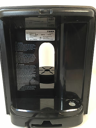
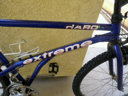
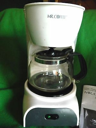
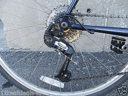
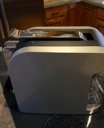

In [4]:
# Supongamos que los super_class_id correspondientes a las primeras cinco categorías son del 0 al 4
categorias_permitidas = [0, 1, 2, 3, 4]  # Corresponde a bicycle, cabinet, chair, coffee_maker, fan

# Filtrar el dataset de entrenamiento
datos['train'] = datos['train'].filter(lambda x: tf.reduce_any(tf.equal(x['super_class_id'], categorias_permitidas)))

# Filtrar el dataset de prueba
datos['test'] = datos['test'].filter(lambda x: tf.reduce_any(tf.equal(x['super_class_id'], categorias_permitidas)))

#Una forma de mostrar 5 ejemplos del set
tfds.as_dataframe(datos['train'].take(5), metadatos)

,class_id,image,super_class_id,super_class_id/num
0,2773,,3 (coffee_maker),3
1,243,,0 (bicycle),0
2,2942,,3 (coffee_maker),3
3,214,,0 (bicycle),0
4,3283,,3 (coffee_maker),3

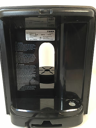
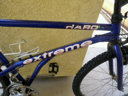
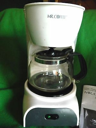
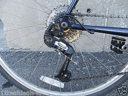
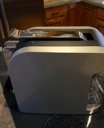

In [5]:
#Una forma de mostrar 5 ejemplos del set
tfds.as_dataframe(datos['train'].take(5), metadatos)

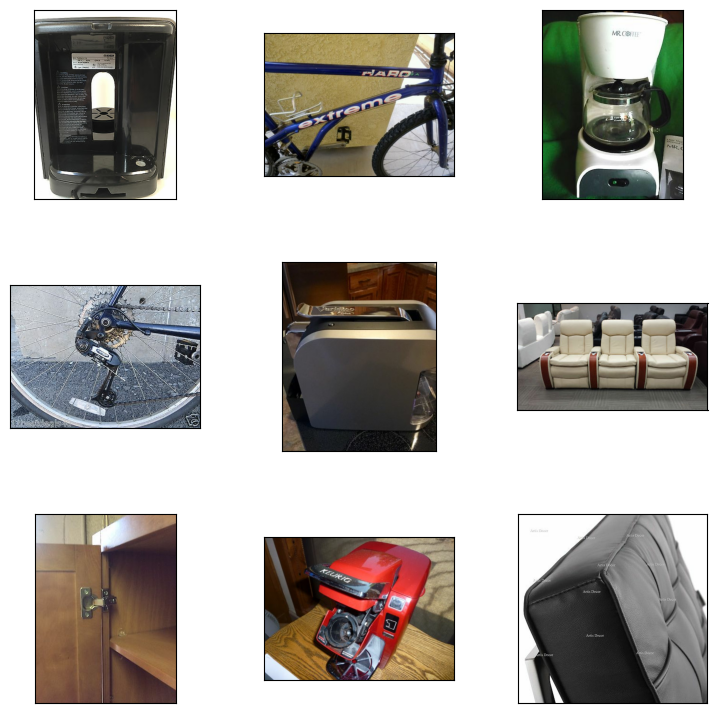

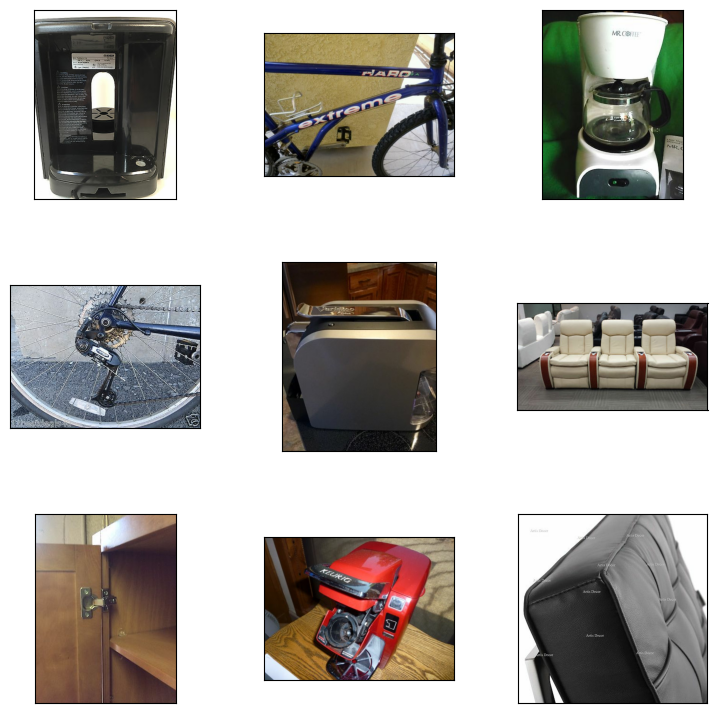

In [6]:
#Otra forma de mostrar ejemplos del set
tfds.show_examples(datos['train'], metadatos)

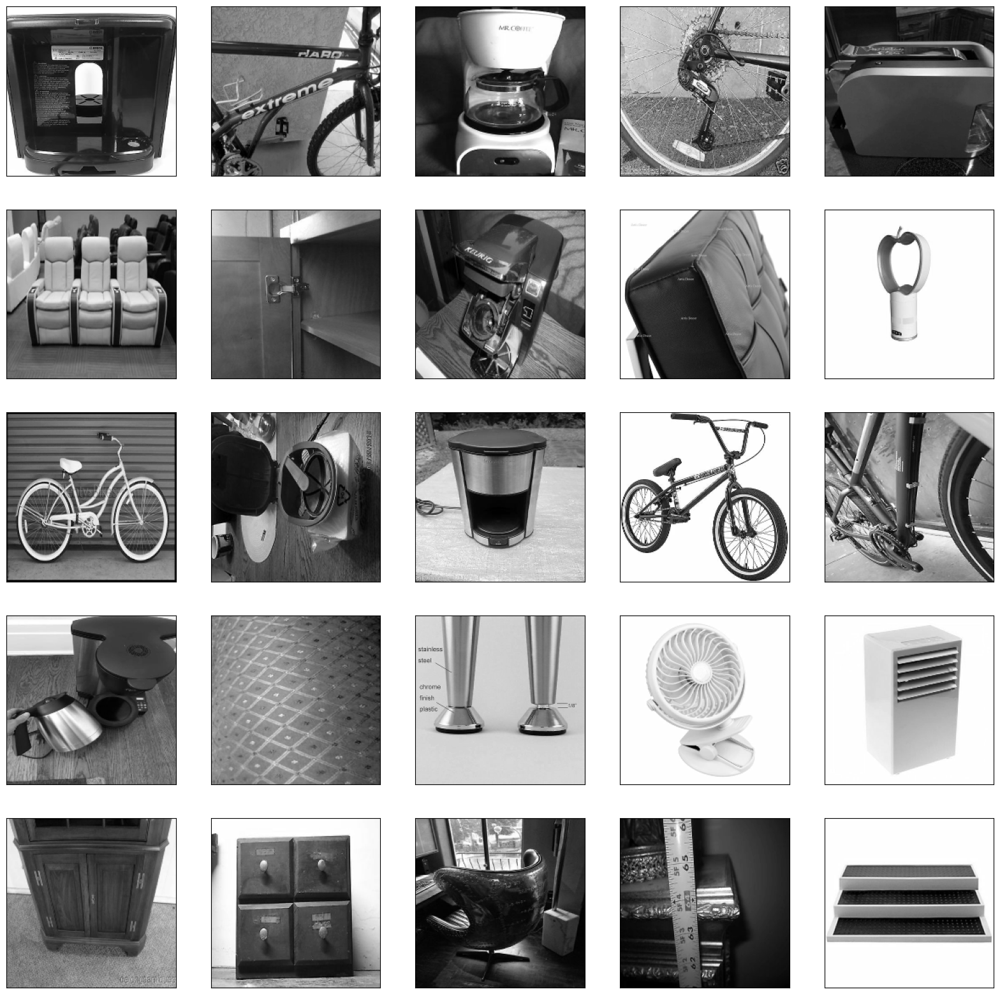

In [7]:
#Manipular y visualizar el set
#Lo pasamos a TAMANO_IMG (100x100) y a blanco y negro (solo para visualizar)
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=200

for i, ejemplo in enumerate(datos['train'].take(25)):  # `ejemplo` es un diccionario
    imagen = ejemplo['image']  # Acceder a la imagen en el diccionario
    etiqueta = ejemplo['super_class_id']  # Acceder a la etiqueta (super_class_id)
    imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen, cmap='gray')


In [8]:
#Variable que contendra todos los pares de los datos (imagen y etiqueta) ya modificados (blanco y negro, 100x100)
datos_entrenamiento = []

In [9]:
for i, ejemplo in enumerate(datos['train']):  # Accede al diccionario
    imagen = ejemplo['image']  # Extraer la imagen del diccionario
    etiqueta = ejemplo['super_class_id']  # Extraer la etiqueta

    # Convertir la imagen de tensor a numpy array y procesarla
    imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))  # Redimensionar imagen
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)  # Convertir a escala de grises
    imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)  # Redimensionar a (100, 100, 1) para tener un canal

    datos_entrenamiento.append([imagen, etiqueta])  # Añadir imagen y etiqueta a la lista

In [10]:
#Ver los datos del primer indice
datos_entrenamiento[0]

[array([[[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        ...,
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=3>]

In [11]:
#Ver cuantos datos tengo en la variable
len(datos_entrenamiento)

23839

In [12]:
#Preparar mis variables X (entradas) y y (etiquetas) separadas

X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [13]:
X

[array([[[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        ...,
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]],
 
        [[254],
         [254],
         [254],
         ...,
         [254],
         [254],
         [254]]], dtype=uint8),
 array([[[114],
         [120],
         [117],
         ...,
         [ 36],
         [ 34],
         [ 38]],
 
        [[114],
         [122],
         [124],
         ...,
         [ 39],
         [ 40],
         [ 43]],
 
        [[120],
         [124],
         [121],
         ...,
      

In [14]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [15]:
y

[<tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=3>,
 <tf.Tensor: shape=(), dtype=int64, numpy=2>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=4>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64

In [16]:
#Convertir etiquetas en arreglo simple
y = np.array(y)

In [17]:
X.shape

(23839, 200, 200, 1)

In [ ]:
import gc
gc.collect()

49236

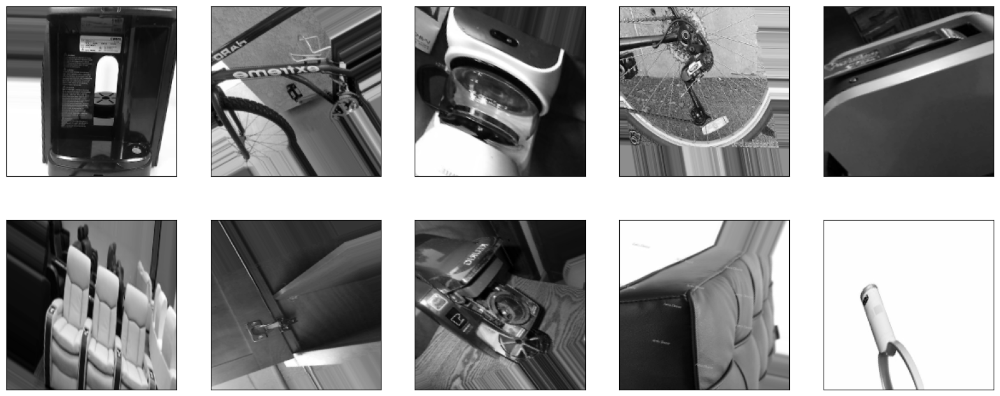

In [18]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(200, 200), cmap="gray")
  break

In [19]:
modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.InputLayer(input_shape=(200, 200, 1)),  # Especificar el tamaño de la entrada
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(200, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')  # Asegúrate de que coincida con el número de clases
])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [20]:
modeloCNN_AD.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [21]:
from tensorflow.keras.callbacks import TensorBoard

#Cargar la extension de tensorboard de colab
%load_ext tensorboard
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [22]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #20200


20263.149999999998

In [23]:
len(X) - 20200 #3639

3639

In [24]:
X_entrenamiento = X[:20200]
X_validacion = X[20200:]

y_entrenamiento = y[:20200]
y_validacion = y[20200:]

In [25]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [26]:
dataset_entrenamiento = tf.data.Dataset.from_tensor_slices((X_entrenamiento, y_entrenamiento))
dataset_entrenamiento = dataset_entrenamiento.batch(32).repeat()

In [27]:
dataset_validacion = tf.data.Dataset.from_tensor_slices((X_validacion, y_validacion))
dataset_validacion = dataset_validacion.batch(32)

In [28]:
steps_per_epoch = int(np.ceil(len(X_entrenamiento) / float(32)))
validation_steps = int(np.ceil(len(X_validacion) / 32))

In [29]:
# Crear el callback de TensorBoard
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

# Entrenamiento sin validación, con callback de TensorBoard
historial = modeloCNN_AD.fit(
    dataset_entrenamiento,
    epochs=150,  # Número de épocas
    steps_per_epoch=steps_per_epoch,
    callbacks=[tensorboardCNN_AD]  # Añadir el callback aquí
)

# Evaluar el conjunto de validación por separado
val_loss, val_accuracy = modeloCNN_AD.evaluate(dataset_validacion, steps=validation_steps)

Epoch 1/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 20s 14ms/step - accuracy: 0.4101 - loss: 1.3958
Epoch 2/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.6261 - loss: 0.9481
Epoch 3/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.7604 - loss: 0.6417
Epoch 4/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.8687 - loss: 0.3492
Epoch 5/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9246 - loss: 0.2102
Epoch 6/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9585 - loss: 0.1253
Epoch 7/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9726 - loss: 0.0906
Epoch 8/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9769 - loss: 0.0725
Epoch 9/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9858 - loss: 0.0469
Epoch 10/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9854 - loss: 0.0488
Epoch 11/150
632/632 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.9865 - loss: 0.0446
Epoch 12/150
632/632 ━━━━━━━━

In [30]:
with tf.summary.create_file_writer('logs/cnn_AD/validation').as_default():
    tf.summary.scalar('val_loss', val_loss, step=150)
    tf.summary.scalar('val_accuracy', val_accuracy, step=150)

In [43]:
print(modeloCNN_AD.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 198, 198, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 99, 99, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 97, 97, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 48, 48, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 46, 46, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 23, 23, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 67712)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 200)                 │      13,542,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │           1,005 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,636,279 (52.02 MB)

 Trainable params: 13,636,277 (52.02 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

None


In [31]:
modeloCNN_AD.save('products_img.h5')

In [58]:
modeloCNN_AD.export('saved_model_directory')

Saved artifact at 'saved_model_directory'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 200, 200, 1), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  133566924467616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924462336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924465152: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924286864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924280528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924280000: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924149632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924151392: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924159136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133566924158256: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [49]:
!pip install tensorflowjs

In [51]:
!mkdir carpeta_salida_keras

In [34]:
!tensorflowjs_converter --input_format keras products_img.h5 carpeta_salida


2024-09-27 04:56:57.101761: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-27 04:56:57.123455: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-27 04:56:57.129941: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-27 04:56:58.261227: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
failed to lookup keras version from the file,
    this is likely a weight only file


In [63]:
!tensorflowjs_converter --input_format=tf_saved_model --output_format=tfjs_graph_model saved_model_directory carpeta_salida_keras


2024-09-27 05:47:39.135088: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-27 05:47:39.156582: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-27 05:47:39.163057: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-27 05:47:40.305656: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-09-27 05:47:42.490200: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0000 00:00:1727416062.73

In [35]:
# Instalar PIL (si es necesario)
!pip install Pillow


In [36]:
from PIL import Image
import numpy as np
import tensorflow as tf

# Cargar el modelo previamente entrenado
modeloCNN_AD = tf.keras.models.load_model('products_img.h5')  # O 'products_img.keras'

# Función para cargar y procesar la imagen
def cargar_y_procesar_imagen(ruta_imagen):
    # Cargar la imagen desde la ruta
    imagen = Image.open(ruta_imagen)

    # Redimensionar la imagen a 200x200
    imagen = imagen.resize((200, 200))

    # Convertir la imagen a escala de grises (si es necesario)
    imagen = imagen.convert('L')  # L convierte a escala de grises

    # Convertir la imagen a un array numpy y normalizarla
    imagen_array = np.array(imagen).astype('float32') / 255.0

    # Redimensionar para cumplir con la forma de entrada del modelo: (1, 150, 150, 1)
    imagen_array = np.expand_dims(imagen_array, axis=-1)  # Añadir el canal
    imagen_array = np.expand_dims(imagen_array, axis=0)   # Añadir el lote

    return imagen_array

# Función para realizar la predicción
def predecir_imagen(modelo, imagen_preprocesada):
    # Realizar la predicción
    prediccion = modelo.predict(imagen_preprocesada)

    # Obtener la clase con mayor probabilidad
    clase_predicha = np.argmax(prediccion)

    return clase_predicha




In [37]:
# Probar con una imagen del servidor local
ruta_imagen = 'bici.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
El modelo predice que la imagen es: Bicycle


In [38]:
# Probar con una imagen del servidor local
ruta_imagen = 'armario.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
El modelo predice que la imagen es: Cabinet


In [39]:
# Probar con una imagen del servidor local
ruta_imagen = 'silla.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
El modelo predice que la imagen es: Chair


In [40]:
# Probar con una imagen del servidor local
ruta_imagen = 'cafe.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
El modelo predice que la imagen es: Coffee Maker


In [41]:
# Probar con una imagen del servidor local
ruta_imagen = 'ven.jpg'  # Especifica la ruta de tu imagen
imagen_preprocesada = cargar_y_procesar_imagen(ruta_imagen)
clase_predicha = predecir_imagen(modeloCNN_AD, imagen_preprocesada)

# Etiquetas del modelo (modifica según las clases en tu modelo)
etiquetas = ['Bicycle', 'Cabinet', 'Chair', 'Coffee Maker', 'Fan']
print(f"El modelo predice que la imagen es: {etiquetas[clase_predicha]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
El modelo predice que la imagen es: Fan


In [61]:
import shutil

# Nombre de la carpeta que deseas comprimir
carpeta_a_comprimir = 'carpeta_salida_keras'

# Nombre del archivo ZIP de salida
nombre_archivo_zip = 'salida_comprimida_keras'

# Comprimir la carpeta en un archivo ZIP
shutil.make_archive(nombre_archivo_zip, 'zip', carpeta_a_comprimir)

print(f"Carpeta '{carpeta_a_comprimir}' comprimida como '{nombre_archivo_zip}.zip'")


Carpeta 'carpeta_salida_keras' comprimida como 'salida_comprimida_keras.zip'
